In [1]:
#Importing the necessary libraries for analysis
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#To avoid displaying future warnings
import warnings
warnings.filterwarnings(action="ignore")

## Data pre-processing for analysis

In [2]:
#Reading the data -
df = pd.read_csv("zomato.csv")
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [3]:
#Cheking the columns present there in the df, this returs the column names in a list
df.columns

Index(['url', 'address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'phone', 'location', 'rest_type', 'dish_liked', 'cuisines',
       'approx_cost(for two people)', 'reviews_list', 'menu_item',
       'listed_in(type)', 'listed_in(city)'],
      dtype='object')

In [4]:
#Checking about the data types in the df
df.dtypes

url                            object
address                        object
name                           object
online_order                   object
book_table                     object
rate                           object
votes                           int64
phone                          object
location                       object
rest_type                      object
dish_liked                     object
cuisines                       object
approx_cost(for two people)    object
reviews_list                   object
menu_item                      object
listed_in(type)                object
listed_in(city)                object
dtype: object

#### Okay, looks like most of the data is in object type, so we have a lot of work to do now!

In [5]:
#Checking for the shape of the df to see how many total rows and  columns are there in df
df.shape

(51717, 17)

#### So, we can see over here that we've somewhere around "51K" Rows and "17" Columns in this DataSet.

Now, the actual data pre-processing & cleaning happens

### Data cleaning -

In [6]:
#Checking for "Missing values" against each feature - 
df.isnull().sum()

url                                0
address                            0
name                               0
online_order                       0
book_table                         0
rate                            7775
votes                              0
phone                           1208
location                          21
rest_type                        227
dish_liked                     28078
cuisines                          45
approx_cost(for two people)      346
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

In [7]:
#Now, to check the "Percentage" of "Missing values" in our data
#Let's 1st, Check the "Features" which are having "Missing values"
feature_NA = [feature for feature in df.columns if df[feature].isnull().sum() > 0]
feature_NA

['rate',
 'phone',
 'location',
 'rest_type',
 'dish_liked',
 'cuisines',
 'approx_cost(for two people)']

We have 6 features that have some percentage of missing values

In [8]:
#Checking for the "Percentage" of missing values in my data
for feature in feature_NA:
    print('{} has {}% Missing values'.format(feature, np.round(df[feature].isnull().sum()/len(df)*100, 2)))

rate has 15.03% Missing values
phone has 2.34% Missing values
location has 0.04% Missing values
rest_type has 0.44% Missing values
dish_liked has 54.29% Missing values
cuisines has 0.09% Missing values
approx_cost(for two people) has 0.67% Missing values


##### We have "dish_liked" as the highest percentage followed by "rate" and the least is location.

## Substitution / Imputation of missing values -

In [9]:
#Let's start with the "rate" feature
df['rate']

0         4.1/5
1         4.1/5
2         3.8/5
3         3.7/5
4         3.8/5
          ...  
51712    3.6 /5
51713       NaN
51714       NaN
51715    4.3 /5
51716    3.4 /5
Name: rate, Length: 51717, dtype: object

In [10]:
#Checking for the unique values
df['rate'].unique()

array(['4.1/5', '3.8/5', '3.7/5', '3.6/5', '4.6/5', '4.0/5', '4.2/5',
       '3.9/5', '3.1/5', '3.0/5', '3.2/5', '3.3/5', '2.8/5', '4.4/5',
       '4.3/5', 'NEW', '2.9/5', '3.5/5', nan, '2.6/5', '3.8 /5', '3.4/5',
       '4.5/5', '2.5/5', '2.7/5', '4.7/5', '2.4/5', '2.2/5', '2.3/5',
       '3.4 /5', '-', '3.6 /5', '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5',
       '4.1 /5', '3.7 /5', '3.1 /5', '2.9 /5', '3.3 /5', '2.8 /5',
       '3.5 /5', '2.7 /5', '2.5 /5', '3.2 /5', '2.6 /5', '4.5 /5',
       '4.3 /5', '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '4.6 /5',
       '4.9 /5', '3.0 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5',
       '2.1 /5', '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

Okay, we have certain data that are not in-line with the data that are "NEW", "Nan", "nan", let's drop all these fields to make the data slicker.

In [11]:
#droping the unusefull data that are irrelavant to the "rate" feature
df.dropna(axis='index', subset=['rate'], inplace=True)

In [12]:
df['rate'].unique()

array(['4.1/5', '3.8/5', '3.7/5', '3.6/5', '4.6/5', '4.0/5', '4.2/5',
       '3.9/5', '3.1/5', '3.0/5', '3.2/5', '3.3/5', '2.8/5', '4.4/5',
       '4.3/5', 'NEW', '2.9/5', '3.5/5', '2.6/5', '3.8 /5', '3.4/5',
       '4.5/5', '2.5/5', '2.7/5', '4.7/5', '2.4/5', '2.2/5', '2.3/5',
       '3.4 /5', '-', '3.6 /5', '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5',
       '4.1 /5', '3.7 /5', '3.1 /5', '2.9 /5', '3.3 /5', '2.8 /5',
       '3.5 /5', '2.7 /5', '2.5 /5', '3.2 /5', '2.6 /5', '4.5 /5',
       '4.3 /5', '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '4.6 /5',
       '4.9 /5', '3.0 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5',
       '2.1 /5', '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

Now, the null values are gone, let's have a quick look at the df to see how may rows that are dropped

In [13]:
df.shape

(43942, 17)

Previously, the df had 51K rows now it has reduced to ~43k rows, so there were 8k rows that had missing values

In [14]:
#Next, simply "Drop" this "Slash Five" i.e. "/5", to improve the 'Readability'.

def split(x):
    return x.split('/')[0]

In [15]:
#'apply' the function to the 'rate' column
df['rate'] = df['rate'].apply(split)

In [16]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


Now, that we got rid of '/5' from our df, let's go ahead and remove all the rest of the irrelavant data from the "rate" feature.

In [17]:
df['rate'].unique()

array(['4.1', '3.8', '3.7', '3.6', '4.6', '4.0', '4.2', '3.9', '3.1',
       '3.0', '3.2', '3.3', '2.8', '4.4', '4.3', 'NEW', '2.9', '3.5',
       '2.6', '3.8 ', '3.4', '4.5', '2.5', '2.7', '4.7', '2.4', '2.2',
       '2.3', '3.4 ', '-', '3.6 ', '4.8', '3.9 ', '4.2 ', '4.0 ', '4.1 ',
       '3.7 ', '3.1 ', '2.9 ', '3.3 ', '2.8 ', '3.5 ', '2.7 ', '2.5 ',
       '3.2 ', '2.6 ', '4.5 ', '4.3 ', '4.4 ', '4.9', '2.1', '2.0', '1.8',
       '4.6 ', '4.9 ', '3.0 ', '4.8 ', '2.3 ', '4.7 ', '2.4 ', '2.1 ',
       '2.2 ', '2.0 ', '1.8 '], dtype=object)

In [18]:
#we will remove all the '-', 'NEW' from the df
#I am going to replace all the "NEW" with the 0, as we are assuming that they have not given any ratting
df['rate'].replace('NEW','0', inplace=True)

In [19]:
#Let's do the same again for '-'
df['rate'].replace('-', '0', inplace=True)

In [20]:
df['rate'].unique()

array(['4.1', '3.8', '3.7', '3.6', '4.6', '4.0', '4.2', '3.9', '3.1',
       '3.0', '3.2', '3.3', '2.8', '4.4', '4.3', '0', '2.9', '3.5', '2.6',
       '3.8 ', '3.4', '4.5', '2.5', '2.7', '4.7', '2.4', '2.2', '2.3',
       '3.4 ', '3.6 ', '4.8', '3.9 ', '4.2 ', '4.0 ', '4.1 ', '3.7 ',
       '3.1 ', '2.9 ', '3.3 ', '2.8 ', '3.5 ', '2.7 ', '2.5 ', '3.2 ',
       '2.6 ', '4.5 ', '4.3 ', '4.4 ', '4.9', '2.1', '2.0', '1.8', '4.6 ',
       '4.9 ', '3.0 ', '4.8 ', '2.3 ', '4.7 ', '2.4 ', '2.1 ', '2.2 ',
       '2.0 ', '1.8 '], dtype=object)

#### Now, that we got rid of all the irrelavant datas that were present in the "rate" feature now, let's check for the dtype and convert that into a calculatable dtype to perform math operations.

In [21]:
df['rate'].dtype

dtype('O')

In [22]:
#Converting the object dtype into float
df['rate'] = df['rate'].astype(dtype= float)

In [23]:
df['rate'].dtype

dtype('float64')

In [24]:
#now, the "rate" column is ready for analysis purpose
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


## In-depth Analysis of restaurant - 

### Use Case 1-

**1. Calulate Avg. Rating of each restaurant**

**2. Get distribution of rating column & try to find out what distribution this feature support?**

**3. Top restaurant chains in Bengalore**

**4. How many of the restaurant do not accept online orders**

In [25]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [26]:
#Q1, calculating the avg. rating of each restaurant -->
df.groupby('name')['rate'].mean()

name
#FeelTheROLL                                    3.400000
#L-81 Cafe                                      3.900000
#refuel                                         3.700000
1000 B.C                                        3.200000
100ÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ°C            3.700000
                                                  ...   
i-Bar - The Park Bangalore                      3.800000
iFruit Live Ice Creams                          3.400000
iSpice Resto Cafe                               3.700000
nu.tree                                         4.314286
re:cess - Hilton Bangalore Embassy GolfLinks    4.100000
Name: rate, Length: 7162, dtype: float64

In [27]:
#Let's convert this into a dataframe
df.groupby('name')['rate'].mean().to_frame()

,rate
name,
#FeelTheROLL,3.400000
#L-81 Cafe,3.900000
#refuel,3.700000
1000 B.C,3.200000
100ÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ°C,3.700000
...,...
i-Bar - The Park Bangalore,3.800000
iFruit Live Ice Creams,3.400000
iSpice Resto Cafe,3.700000


#### Now, you'll see that name becomes the "Index" and "rate" becomes our column

In [28]:
#resetting the index to it's original possition
df_rate = df.groupby('name')['rate'].mean().to_frame().reset_index()

In [29]:
df_rate

,name,rate
0,#FeelTheROLL,3.400000
1,#L-81 Cafe,3.900000
2,#refuel,3.700000
3,1000 B.C,3.200000
4,100ÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ°C,3.700000
...,...,...
7157,i-Bar - The Park Bangalore,3.800000
7158,iFruit Live Ice Creams,3.400000
7159,iSpice Resto Cafe,3.700000
7160,nu.tree,4.314286


In [30]:
#Re-naming the columns to easy identification
df_rate.columns = ['Restaurant', 'Avg. rating']
df_rate.head(10)

,Restaurant,Avg. rating
0,#FeelTheROLL,3.400
1,#L-81 Cafe,3.900
2,#refuel,3.700
3,1000 B.C,3.200
4,100ÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ°C,3.700
5,11 to 11 Express Biriyanis,3.500
6,1131 Bar + Kitchen,4.500
7,12th Main - Grand Mercure,4.100
8,1441 Pizzeria,4.100
9,1522 - The Pub,4.212


### Conclusion -
* So, from this you can see each and every 'Restaurant' has different different "Average Rating".
* It means somewhere between **"3 to 4"** are our **Moderate Restaurants** and **greater** than **"4"**, we can say, these are our **"Best Restaurants of Bengalore"**.

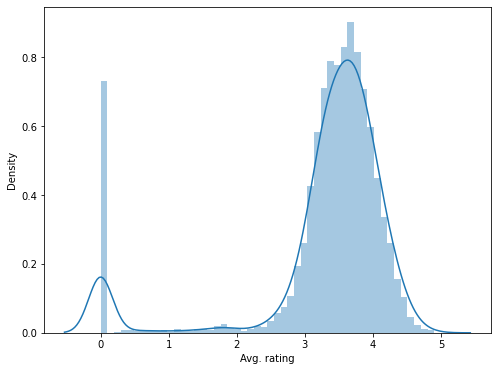

In [31]:
#Q2, Now, let's check the distribution of "rating" column & try to find out what distribution it follows -->
plt.figure(figsize=(8,6))
sns.distplot(df_rate['Avg. rating']);

### Conclution -
* Now that we have a better understanding of the plot, we can state that it is **"Normally Distributed,"** although some of the **"Restaurants"** have **"0 Ratings"** because we have previously changed the *"New"* and *"-"* to the number "0." Because of this, we have *"Zero"* here.
* But from the **2nd one**, we can say that we have some of the "Restaurants" that are **"Very High Rated" (i.e. Almost "5")** and almost **"50 Percent"** of the 'Restaurant' has a "Rating" between this **"3 to 4"** and "Restaurants" having **More than "4.5" 'Ratings'** are **"very Rare".**

In [32]:
df.shape

(43942, 17)

In [33]:
#Q3, Top restaurant chains in Banglore -->
top_20_restaurant_chain = df['name'].value_counts()[0:20]
top_20_restaurant_chain

Cafe Coffee Day        89
Onesta                 85
Empire Restaurant      71
Just Bake              68
Five Star Chicken      68
Kanti Sweets           68
Petoo                  64
Baskin Robbins         63
Pizza Hut              62
Polar Bear             61
Sweet Truth            60
Domino's Pizza         60
KFC                    60
Beijing Bites          60
McDonald's             59
Smoor                  59
Subway                 59
Faasos                 57
Burger King            55
Smally's Resto Cafe    54
Name: name, dtype: int64

In [34]:
#converting the restaurant chains into df
top_20_restaurant_chain = top_20_restaurant_chain.to_frame()

In [35]:
top_20_restaurant_chain = top_20_restaurant_chain.reset_index()

In [36]:
top_20_restaurant_chain.columns = ['Name', 'Value_Count']

In [37]:
top_20_restaurant_chain

,Name,Value_Count
0,Cafe Coffee Day,89
1,Onesta,85
2,Empire Restaurant,71
3,Just Bake,68
4,Five Star Chicken,68
5,Kanti Sweets,68
6,Petoo,64
7,Baskin Robbins,63
8,Pizza Hut,62
9,Polar Bear,61


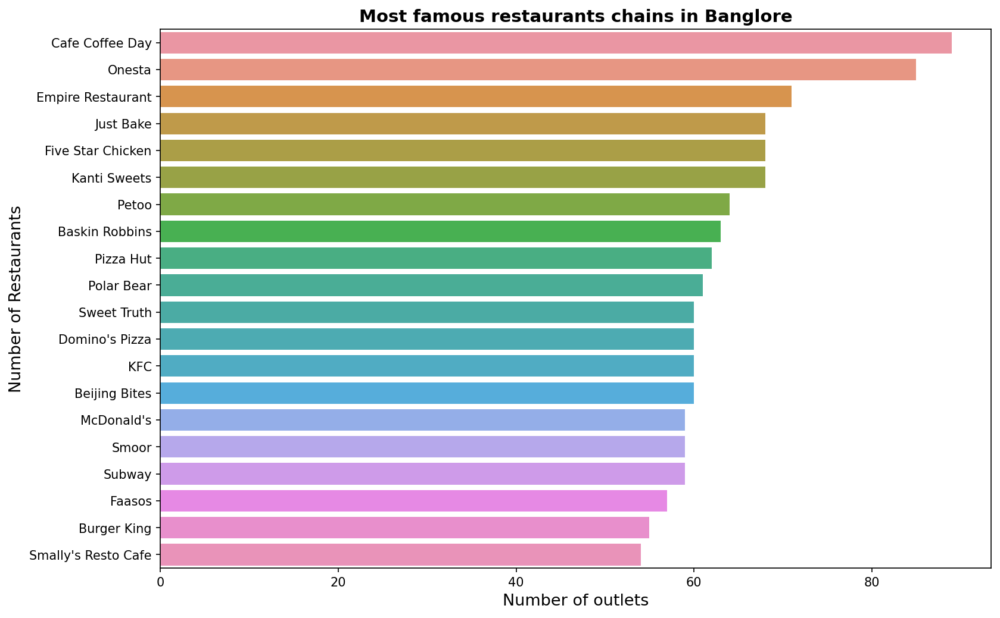

In [38]:
#Plotting it to a bar char to see the visual rep 

plt.figure(figsize=(12,8), dpi=150)

sns.barplot(data=top_20_restaurant_chain, x="Value_Count", y="Name")

plt.title("Most famous restaurants chains in Banglore", fontsize=14, fontweight = 'bold')
plt.xlabel("Number of outlets", fontsize=13)
plt.ylabel("Number of Restaurants", fontsize=13);

### Conclusion -
* Now, from this we can see that we have a **"Cafe Coffee Day"** on **Peak**, then we have **"Onesta"**, then we have **"Empire Restaurant"** and so on.
* So, these are our **"Top 20 Restaurant Chains in Bangalore".**

In [39]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [40]:
#Q4. How many of the Restaurant do not Accept Online Orders -->
online_order = df['online_order'].value_counts()
online_order

Yes    28308
No     15634
Name: online_order, dtype: int64

In [41]:
df['online_order'].value_counts().index

Index(['Yes', 'No'], dtype='object')

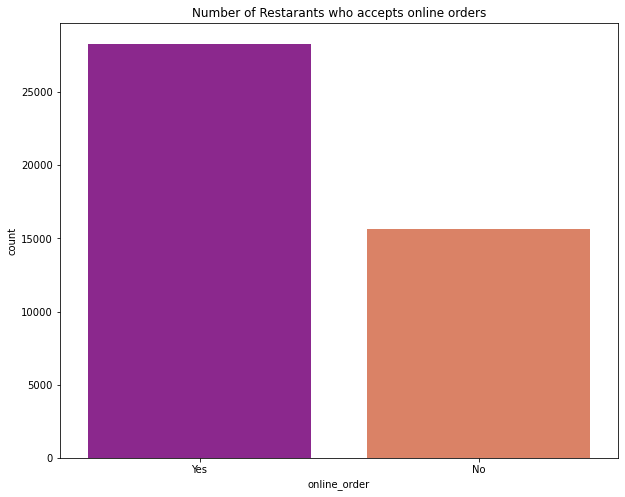

In [42]:
#Number of restarants who acceopts online orders -
plt.figure(figsize = (10,8))

sns.countplot(x=df['online_order'], order = df['online_order'].value_counts().index, palette="plasma")
plt.title("Number of Restarants who accepts online orders")
plt.show()

### Conclusion -
* Approximately, More than **"28.3K" Restaurants** accepts *Online Order* whereas around **"15.6K" Restaurants** does *not accepts Online Order.*

In [43]:
#Now, Let's Plot this Data using a "Pie Chart" as we have Less Number of Entries, using "Plotly".
#Importing Plotly
import plotly.express as px

In [44]:
#Alternate Visual: Now, Let's Plot this Data using a "Pie Chart" as we have Less Number of Entries, using "Plotly".

lables = ['Accepted', 'Not Accepted']

px.pie(data_frame=df, values=online_order, names=lables, title='Restaurants Online Orders Distribution')

#After executing the cell. Now, we can see much more interactive graph

### Conclution -
* From this Pie Chart, We can say, around **"64.4%" Restaurants** accepts **Online Order** whereas around **"35.6%" Restaurants** does **not accepts Online Order**.

# Analysing Most Famous Restaurant -

## Use case 2-

**1. Ratio between restaurant that provide Table & do not provide Table?**

**2. In-depth Analysis of Types of Restaurants we have**

**3. Highest Votes Restaurant**

**4. Total Restaurant at different Locations of Bengalore**

In [45]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [46]:
#Q1. Ratio between Restaurant that provide Table & do not provide Table? -->

book_table_value_count = df['book_table'].value_counts()
book_table_value_count

#Conclusion: So, this will Exactly Return me about "~36.5K" Hotels or Restaurant that doesn't provide the facility of "booking 
#Table" whereas only "6.4K" Hotels provides the facility of "booking Table".

No     37509
Yes     6433
Name: book_table, dtype: int64

In [47]:
#Again, let's make a use of plotly pie chart -

lables = ['Not Book', 'Book']

px.pie(data_frame=df, values=book_table_value_count, names = lables)

#When you run this cell it will diplay the pie chart that will decipt the percentage of hotel that had "Book", and "Not book"

### Conclusion -

* From this Pie Chart, We can say, around **"85.4%" Restaurants doesn't provides** the **facility of "booking Table"** whereas around **"14.6%" Restaurants** provide the **facility of "booking Table"**.

In [48]:
#Q2. In-depth Analysis of Types of Restaurant we have -->

df['rest_type'].isnull().sum()

151

In [49]:
#We have somewhere around "151" Missing Values.
#Droping all the missing values
df.dropna(axis='index', subset=['rest_type'], inplace=True)

In [50]:
df['rest_type'].isnull().sum()

0

In [51]:
#Now, we can see we don't have any 'Missing Value' in this "Restaurant Type" feature.
#So, it means Now, we are ready for the Analysis of this one.

In [52]:
#Checking the Total Types of Restaurant we have -
df['rest_type'].unique()

array(['Casual Dining', 'Cafe, Casual Dining', 'Quick Bites',
       'Casual Dining, Cafe', 'Cafe', 'Quick Bites, Cafe',
       'Cafe, Quick Bites', 'Delivery', 'Mess', 'Dessert Parlor',
       'Bakery, Dessert Parlor', 'Pub', 'Bakery', 'Takeaway, Delivery',
       'Fine Dining', 'Beverage Shop', 'Sweet Shop', 'Bar',
       'Dessert Parlor, Sweet Shop', 'Bakery, Quick Bites',
       'Sweet Shop, Quick Bites', 'Kiosk', 'Food Truck',
       'Quick Bites, Dessert Parlor', 'Beverage Shop, Quick Bites',
       'Beverage Shop, Dessert Parlor', 'Takeaway', 'Pub, Casual Dining',
       'Casual Dining, Bar', 'Dessert Parlor, Beverage Shop',
       'Quick Bites, Bakery', 'Microbrewery, Casual Dining', 'Lounge',
       'Bar, Casual Dining', 'Food Court', 'Cafe, Bakery', 'Dhaba',
       'Quick Bites, Sweet Shop', 'Microbrewery',
       'Food Court, Quick Bites', 'Quick Bites, Beverage Shop',
       'Pub, Bar', 'Casual Dining, Pub', 'Lounge, Bar',
       'Dessert Parlor, Quick Bites', 'Food Court, 

In [53]:
len(df['rest_type'].unique())

87

In [54]:
#So, it is somewhere around "87" different "Restaurant Types".

In [55]:
#Q2. In-depth Analysis of Types of Restaurant we have -->
df['rest_type'].value_counts().nlargest(20)

Quick Bites                   15073
Casual Dining                  9923
Cafe                           3527
Dessert Parlor                 1939
Delivery                       1791
Takeaway, Delivery             1472
Casual Dining, Bar             1141
Bakery                          775
Beverage Shop                   704
Bar                             661
Food Court                      526
Bar, Casual Dining              420
Lounge                          396
Pub                             356
Sweet Shop                      351
Fine Dining                     343
Casual Dining, Cafe             319
Pub, Casual Dining              255
Beverage Shop, Quick Bites      244
Bakery, Quick Bites             234
Name: rest_type, dtype: int64

In [56]:
#Suppose, we want "Top 20" Restaurant Types that Serves more than All these Restaurant.

fig = px.bar(data_frame=df, 
              x=df['rest_type'].value_counts().nlargest(20).index,
              y=df['rest_type'].value_counts().nlargest(20),
              color=df['rest_type'].value_counts().nlargest(20).index,
              labels={'x':'Restautants Type', 'y':'No. of Restaurants Types'},
              title='Top 20 Restaurants Types')

fig.update_layout(showlegend=False)

#### Conclusion - These are our Top 20 Restaurants.

* So from this, We can see **"Quick Bites"** have somewhere around **15K**, whereas the **"Casual Dining"** has 9.9K, "Cafe" has around 3.5K.

In [57]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


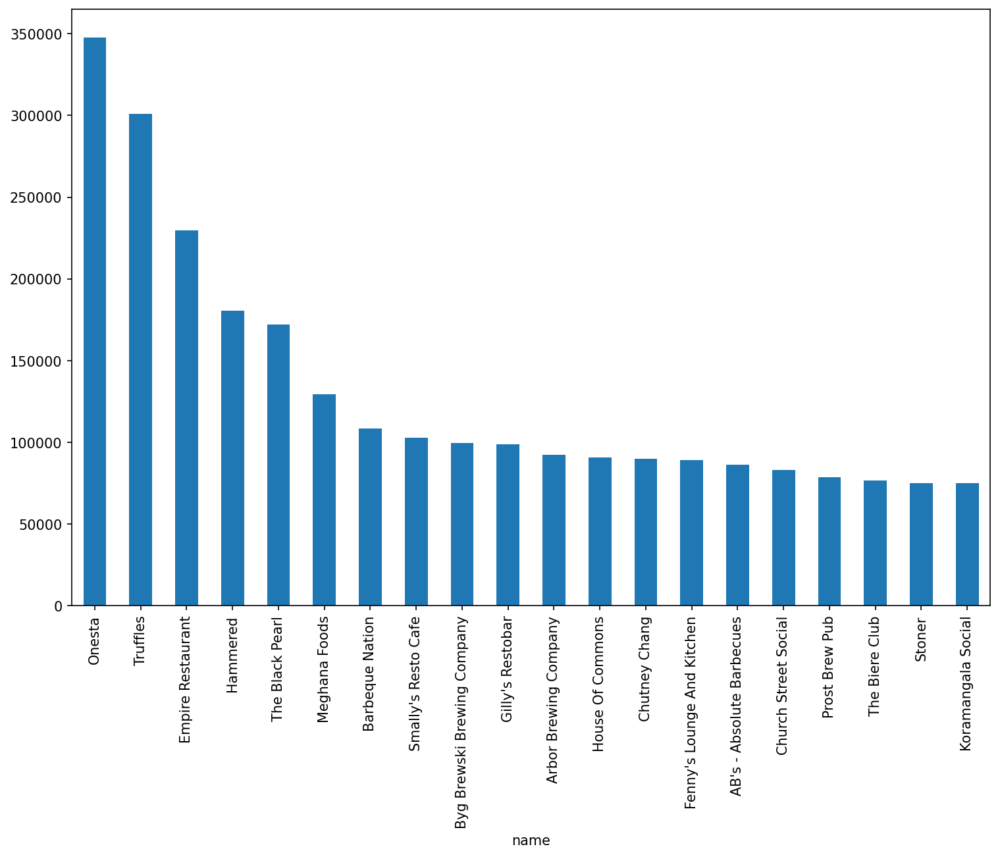

In [58]:
#Q3. Highest Voted Restaurant -
plt.figure(figsize=(12,8), dpi=150)
df.groupby('name')['votes'].sum().nlargest(20).plot.bar();

In [59]:
df.groupby('name')['votes'].sum().nlargest(20).to_frame().head()

,votes
name,
Onesta,347520
Truffles,301059
Empire Restaurant,229808
Hammered,180602
The Black Pearl,172122


In [60]:
#Alternate visuals using plotly
plt.figure(figsize=(12,8), dpi=150)
px.bar(data_frame = df,
      x = df.groupby('name')['votes'].sum().nlargest(20).index,
      y = df.groupby('name')['votes'].sum().nlargest(20), 
      color = df.groupby('name')['votes'].sum().nlargest(20), 
      labels = {'x':'Name of the Restaurants', 'y':'Total Votes'}, 
       title = 'Highest Voted Restaurants')

<Figure size 1800x1200 with 0 Axes>

#### Conclusion -

* From this, we can say that our **Highest Voted Restaurant** is **"Onesta"**, followed by **"Truffles"** and **"Empire Restaurant".**
* So, you can come up with this Conclusion.

In [61]:
#Q4. What are the Total Restaurants at different locations of Bengalore -

restaurants = []
location=[]
for count,location_detail in df.groupby('location'):
    location.append(count)
    restaurants.append(len(location_detail['name'].unique()))

In [62]:
#Now, both of our Lists are Ready.
#Let's pass on that to a df

df_total = pd.DataFrame(zip(location, restaurants))
df_total.columns = ['Location', 'Restaurant_Count']
df_total

,Location,Restaurant_Count
0,BTM,578
1,Banashankari,238
2,Banaswadi,150
3,Bannerghatta Road,361
4,Basavanagudi,195
...,...,...
87,West Bangalore,3
88,Whitefield,633
89,Wilson Garden,40
90,Yelahanka,3


In [63]:
#Just a check
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [64]:
df.groupby('location')[['name']].count()

,name
location,
BTM,4234
Banashankari,805
Banaswadi,495
Bannerghatta Road,1320
Basavanagudi,628
...,...
West Bangalore,5
Whitefield,1688
Wilson Garden,203


In [65]:
#Just a cross checking -
df1 = df.groupby('location')['name'].unique().to_frame().reset_index()
df1

,location,name
0,BTM,"[Sankranthi Veg Restaurant, Hearts Unlock Cafe..."
1,Banashankari,"[Jalsa, Spice Elephant, San Churro Cafe, Addhu..."
2,Banaswadi,"[Cafe Nibras, The Sanctuary, Crunch Pizzas, Pi..."
3,Bannerghatta Road,"[Deja Vu Resto Bar, Fattoush, Empire Restauran..."
4,Basavanagudi,"[Grand Village, Timepass Dinner, Srinathji's C..."
...,...,...
87,West Bangalore,"[FreshMenu, Fit Dish Fetish, Garden City Mobil..."
88,Whitefield,"[Imperio Cafe, Night Diaries, LocalHost, AB's ..."
89,Wilson Garden,"[Tree Top, Sahana's (Nati Style), Karavali Kol..."
90,Yelahanka,"[Prashanth Naati Corner, Cheta's Kitchen, Twis..."


In [66]:
df1['name'][0]

array(['Sankranthi Veg Restaurant', 'Hearts Unlock Cafe', 'eat.fit',
       'Sai Abhiruchi', 'Capsicum Family Restaurant',
       'Hiyar Majhe Kolkata', 'Sri Lakshmi Dhaba', 'XO Belgian Waffle',
       'Swadista Aahar', 'Vegetarea', 'YummRajj', 'Swad Punjab Da',
       'Roti Wala', 'Midnight Mania', 'Apna Punjab', 'Paratha Junction',
       'Momoz', 'Kalingas', 'Kullad Cafe', 'Litti Twist', 'Poha House',
       'Bathinda Tandoor', 'Delight Food', 'Chicken Magic',
       'New Mahesh Friends Food Corner', 'MRA', 'Shaadi Ki Biryani',
       'Mahesh Friends Food Center', 'Alankrutha', 'Sri Punjabi Dhaba',
       'Indian Food', 'Tandoori Paradise', 'Polar Bear', 'Sher-E-Punjab',
       'Aramane Donne Biriyani', 'Amontron', 'Birinz', 'Biriyani Bhatti',
       'C. K. Mega Hot Food', 'RSS Donne Biryani',
       'PHEW (Play Hard Eat Wild)', 'Veruthe Oru Thattukada', 'Warm Oven',
       'The Shawarma Shop', 'Pathaan Sir', 'Hari Super Sandwich',
       'Chokha Chowka', 'Gorbandh', 'Bathinda Junct

In [67]:
#Jusrt a cross check
len(df1['name'][0])

578

In [68]:
df1['name'][1]

array(['Jalsa', 'Spice Elephant', 'San Churro Cafe',
       'Addhuri Udupi Bhojana', 'Onesta', 'Penthouse Cafe', 'Smacznego',
       'CafÃ\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â© Down The Alley',
       'Cafe Shuffle', 'The Coffee Shack', 'Caf-Eleven', 'Cafe Vivacity',
       'Catch-up-ino', "Kirthi's Biryani", 'T3H Cafe',
       '360 Atoms Restaurant And Cafe', 'The Vintage Cafe',
       'Woodee Pizza', 'Cafe Coffee Day', 'My Tea House', 'Hide Out Cafe',
       'CAFE NOVA', 'Coffee Tindi', 'Sea Green Cafe', 'Cuppa',
       'Foodiction', 'Sweet Truth', 'Ovenstory Pizza', 'Faasos',
       'Behrouz Biryani', 'Fast And Fresh', 'Szechuan Dragon',
       'Maruthi Davangere Benne Dosa', 'Havyaka Mess', "McDonald's",
       "Domino's Pizza", 'Hotboxit', 'Petoo', 'Corner House Ice Cream',
       'Roving Feast', 'FreshMenu', 'Banashankari Donne Biriyani',
       'Wamama', 'Five Star Chicken', 'XO Belgian Waffle',
       'Peppy Peppers', '1947', 'Cake of the D

In [69]:
#Just a cross check -
len(df1['name'][1])

238

In [70]:
df1['name'][2]

array(['Cafe Nibras', 'The Sanctuary', 'Crunch Pizzas', 'Pizza Stop',
       'Vijaya Gardenia', "Kenny's Restaurant",
       'Jai Mataji Farshan & Sweets', 'Waffle Stories', "Mummy's Kitchen",
       'North Se South Veg & Non-Veg Restaurants', '7 to 11 Food Court',
       'The Gluten Free Baking Co.', 'Meat And Eat',
       "The Lovin' Oven Cakery", 'Upsouth', 'Knowhere',
       'Biryani Paradise', 'WOW! Momo', 'Udupas Veg Restaurant',
       'Patio - The Resto Cafe', 'Mayonaise', 'Srinathjis',
       'Cafe Get Hooked', 'Coffee@Arens', 'T4U Cafe', 'Lava Kaffe',
       'Urban Bakes & Cafe', "Leon's Take Away", 'Nandhini',
       'Donne Biryani Kuteera', 'Bhavani Restaurant',
       'Adukkala Restaurant', 'De Grand Restaurant', 'Inchara Restaurant',
       'Udupi Sri Krishna Cafe', 'The London Shakes', 'Taste Of Nawaabs',
       'Akshaya Family Restaurant', 'Tamarind - Tamarind Hospitality',
       "Despiwich Dragon's Kitchen", "Thanco's Natural Ice Cream",
       'Gowdru Hotel', 'Suvarn

In [71]:
#Just a cross check
len(df1['name'][3])

361

In [72]:
#Just a cross check
len(df1['name'][4])

195

In [73]:
#Back to our problem statement
df_total.head()

,Location,Restaurant_Count
0,BTM,578
1,Banashankari,238
2,Banaswadi,150
3,Bannerghatta Road,361
4,Basavanagudi,195


In [74]:
#Now, suppose if we have to Find-out the "Top 10 Places that have Maximum Number of Restaurant".

df_total.set_index('Location', inplace=True)
df_total

,Restaurant_Count
Location,
BTM,578
Banashankari,238
Banaswadi,150
Bannerghatta Road,361
Basavanagudi,195
...,...
West Bangalore,3
Whitefield,633
Wilson Garden,40


<AxesSubplot:xlabel='Location'>

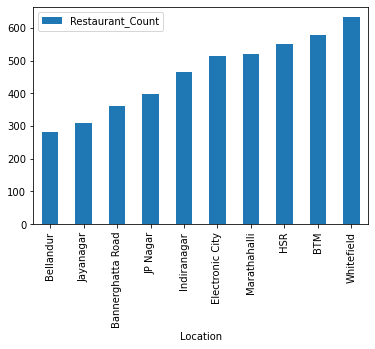

In [75]:
#Let's "sort_values()" which will give us the "Top 10 Places" that have "Highest Number of Restaurant".

df_total.sort_values(by='Restaurant_Count').tail(10).plot.bar()

In [76]:
#Alternate Way - Plot the same using "Plotly" -->
df_total

,Restaurant_Count
Location,
BTM,578
Banashankari,238
Banaswadi,150
Bannerghatta Road,361
Basavanagudi,195
...,...
West Bangalore,3
Whitefield,633
Wilson Garden,40


In [77]:
df_total.groupby('Location')['Restaurant_Count'].sum().nlargest(10).to_frame().head()     #Created a "group" and filtered to 
#"Top 10" Values.

,Restaurant_Count
Location,
Whitefield,633
BTM,578
HSR,551
Marathahalli,520
Electronic City,515


In [78]:
#Alternate Visual - Using "Plotly" -->
px.bar(data_frame=df_total,
      x=df_total.groupby('Location')['Restaurant_Count'].sum().nlargest(10).index,
      y=df_total.groupby('Location')['Restaurant_Count'].sum().nlargest(10),
      color=df_total.groupby('Location')['Restaurant_Count'].sum().nlargest(10))

### Conclusion -
* So from this, We can say, **Widefield** and **BTM** has the **Maximum Number of Restaurants**.

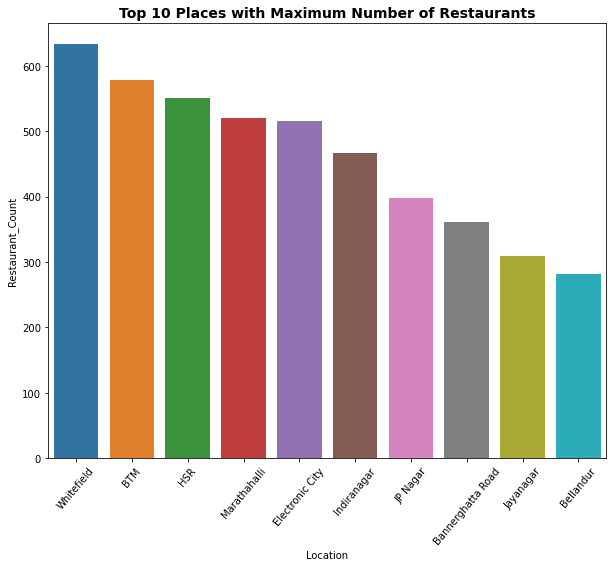

In [79]:
#Another Alternative - Using "Seaborn".
plt.figure(figsize=(10,8))

sns.barplot(x=df_total.groupby('Location')['Restaurant_Count'].sum().nlargest(10).index,
           y=df_total.groupby('Location')['Restaurant_Count'].sum().nlargest(10))

plt.xticks(rotation=50)
plt.title("Top 10 Places with Maximum Number of Restaurants", fontsize=14, weight='bold')

plt.show()

## Analysing price of Restaurants
### Usecase 3 -

**1. Total number of Variety of restorents in Banglore**

**2. Analyse Approx. cost of 2 people feature**

**3. Analyse "Approx cost of 2 people" vs "rating". Find out the relationship between them.**

**4. Is there any diffrence between "vote" and "Restaurants" Accepting and Not Accepting "Online_orders"**

**5. Is there any diffrence between "Price" and "Restaurants" Accepting and Not Accepting "Online_Orders"**

In [80]:
#Q1. Total Number of variety of Restaurants in Bangalore.
#Suppose, we want First "Top 10 cuisines".

df['cuisines'].value_counts()[0:10]

North Indian                           2284
North Indian, Chinese                  2036
South Indian                           1320
Cafe                                    653
Bakery, Desserts                        644
Biryani                                 632
South Indian, North Indian, Chinese     601
Fast Food                               580
Desserts                                572
Chinese                                 449
Name: cuisines, dtype: int64

In [81]:
#Now, Let's plot this data -
px.bar(x=df['cuisines'].value_counts()[0:10].index,
      y=df['cuisines'].value_counts()[0:10])

### Conclusion -

* So from this, we can observe that the **North Indian and Chinese, South Indian, Cafe, Bakery, Biryani, of course, are most Common.**
* It means **Bangalore is more influenced by North Indian culture more than South.**

In [82]:
#Q2. Analyse Approx. Cost of 2 People -->
#Very first, Let's Check whether it has some "NaN" Value or not.
df['approx_cost(for two people)'].isnull().sum()

250

In [83]:
#"drop" All the "Missing Values" -
df.dropna(axis='index', subset=['approx_cost(for two people)'], inplace=True)

In [84]:
df['approx_cost(for two people)'].isnull().sum()

0

In [85]:
#Let's Check the current DataType of this Feature -
df['approx_cost(for two people)'].dtype

dtype('O')

In [86]:
#So, from this you will see right now it is of "Object", whereas Approx. Cost must be of "Integer" or "Float" Type.
#It means it contains/cosists some of the "String" Values.

In [87]:
#So,Let's Check "unique()" Values.
df['approx_cost(for two people)'].unique()

array(['800', '300', '600', '700', '550', '500', '450', '650', '400',
       '900', '200', '750', '150', '850', '100', '1,200', '350', '250',
       '950', '1,000', '1,500', '1,300', '199', '80', '1,100', '160',
       '1,600', '230', '130', '1,700', '1,400', '1,350', '2,200', '2,000',
       '1,800', '1,900', '180', '330', '2,500', '2,100', '3,000', '2,800',
       '3,400', '50', '40', '1,250', '3,500', '4,000', '2,400', '2,600',
       '1,450', '70', '3,200', '560', '240', '360', '6,000', '1,050',
       '2,300', '4,100', '120', '5,000', '3,700', '1,650', '2,700',
       '4,500'], dtype=object)

In [88]:
#Now, Let's 'Remove' all the "Comma's" over here.
df['approx_cost(for two people)'] = df['approx_cost(for two people)'].apply(lambda x: x.replace(',',''))

In [89]:
#Just a cross check
df['approx_cost(for two people)'].unique()

array(['800', '300', '600', '700', '550', '500', '450', '650', '400',
       '900', '200', '750', '150', '850', '100', '1200', '350', '250',
       '950', '1000', '1500', '1300', '199', '80', '1100', '160', '1600',
       '230', '130', '1700', '1400', '1350', '2200', '2000', '1800',
       '1900', '180', '330', '2500', '2100', '3000', '2800', '3400', '50',
       '40', '1250', '3500', '4000', '2400', '2600', '1450', '70', '3200',
       '560', '240', '360', '6000', '1050', '2300', '4100', '120', '5000',
       '3700', '1650', '2700', '4500'], dtype=object)

In [90]:
#Converting the Data Type -
df['approx_cost(for two people)'] = df['approx_cost(for two people)'].astype(int)

In [91]:
df['approx_cost(for two people)'].dtype

dtype('int32')

In [92]:
#Now, is returning me "int32". It means, Now it is of "Integer" Data Type.
#It means, Now, our this Feature gets Pre-Processed and I'm ready to do some Analysis on this Feature.

<AxesSubplot:xlabel='approx_cost(for two people)', ylabel='Density'>

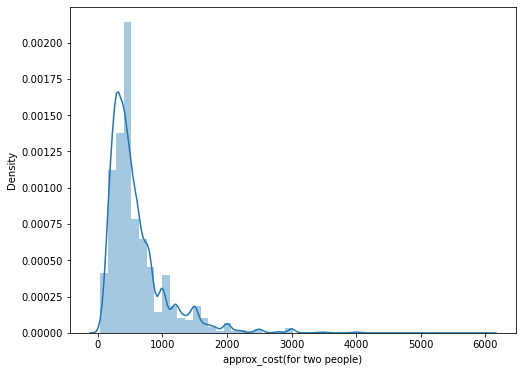

In [93]:
#Now, Moving back to our Problem Statement.
    #Our Problem Statement is to Analyse Approx. Cost of 2 People Feature -->

#But very first, I'm going to Check the "Distribution" of this one.
plt.figure(figsize=(8,6))
sns.distplot(df['approx_cost(for two people)'])

### Conclusion -

* So from this, you will see it Somehow follows some **Skewness** in our Data. Look at this **right Skewness**.
* It means **Most of the Data, follows the Range between Zero to Thousand means about 50% of "Restaurants are Affordable in Bangalore".**

In [94]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


<AxesSubplot:xlabel='rate', ylabel='approx_cost(for two people)'>

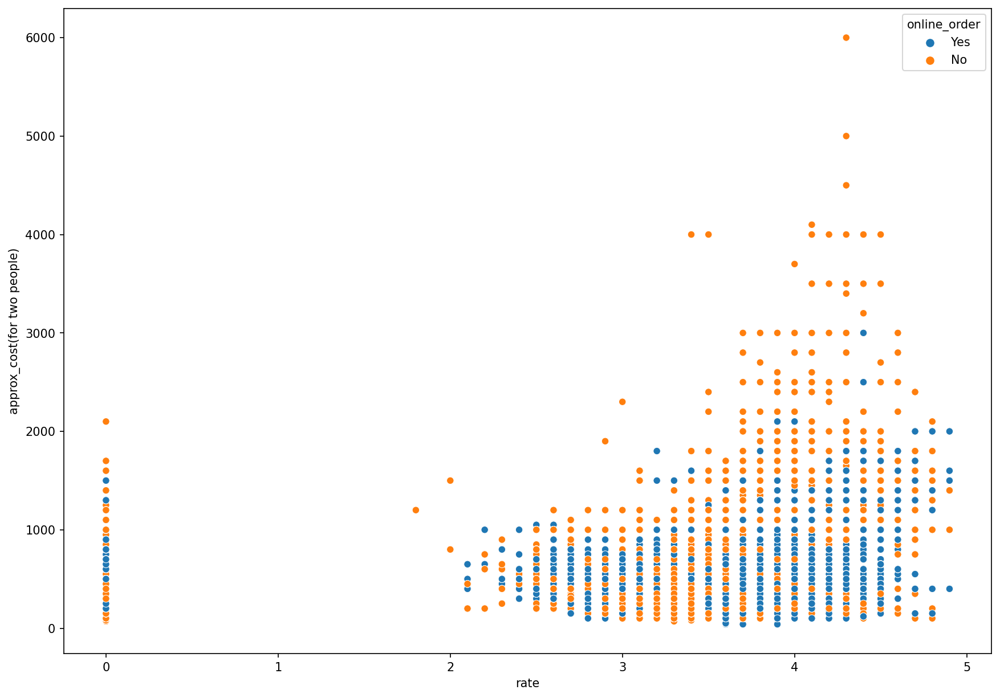

In [95]:
#Q3. Analyse "Approx Cost of 2 People" vs "Rating". Find out the relationship between them.

plt.figure(figsize=(14,10), dpi=150)

sns.scatterplot(data=df, x='rate', y='approx_cost(for two people)', hue='online_order')

In [96]:
#Alternative Visual - Using "Plotly" -->
px.scatter(data_frame=df, x='rate', y='approx_cost(for two people)',
           color='online_order', title="Approx Cost of 2 People vs Rating")

### Conclusion -

* Most of the **Highest Rated Restaurants Accepts "Online Order"** and they are, of course, **affordable** whereas there are some **Highest Rated Restaurants** who do Not **Accepts "Online Order"** and they are **Expensive**

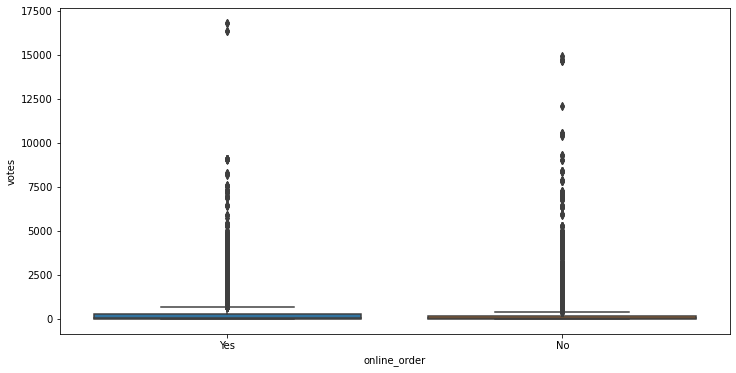

In [97]:
#Q4. Is there any difference b/w 'Votes' and 'Restaurants' Accepting and Not Accepting "Online_Orders".
#So, Let's Call our "Box Plot".

plt.figure(figsize=(12,6))
sns.boxplot(x='online_order', y='votes', data=df);

In [98]:
#Alternative way of viz, through plotly
px.box(data_frame=df,
       x='online_order',
       y='votes', 
       color='online_order')

### Conclusion -

* So from this, look at the Top Most DataPoint of "No", this exactly saying that, **"Online_Order = No" and "Votes" are somewhere around "14K"**
* And At the Box_Plot of "No", will see this exactly is our Min. Value and we've a **Median = 34.**
* And Now, if I look at the At the Box_Plot of "Yes", So it is basically saying that, we've **"Median = 85".**
* So, From this Visualization, we can come up with a Conclusion here, **"Median" Number of Votes** for both Categories Varies because the Restaurant who's Accepting "Online Orders", get More "Votes" from Customers as there is a "Rating" Option popping up after each 'Order Place' from the "Zomato" Application.
* That's Why Restaurants having 'Online Order' faciliy has **"Maximum Number of Votes".**

In [99]:
#Q5. Is there any difference b/w 'Prices' and 'Restaurants' Accepting and Not Accepting "Online_Orders".

px.box(data_frame=df,
       x='online_order',
       y='approx_cost(for two people)')

#So, this Exactly is the "Box Plot" right now.

### Conclusion -

* "Yes" means they (Restaurants) are **Accepting "Online Orders"** and "No" is basically means they are **Not Accepting "Online Orders".**
* So, From this Visualization, you can come up with a Conclusion.
    * **Restaurant Accepting "Online Orders" are More Affordable than Restaurants who are Not Accepting "Online Orders"** same we can see here in No that We have some Data Points that are Higher in Range.

# Analysing Insights form Restaurant Patterns -
## Use case 4 -

**1. Find out Most Luxurious restaurants of Banglore**

**2. Top 10 Most expensive restaurants with approx cost for 2 people.**

**3. What pattern / distribution approx cost for 2 people follows**

**4. Top 10 cheapest restaurants with approx cost for 2 people.**

**5. Find all the restaurants that are below 500 (Budget hotels) as well as affordable.**

In [100]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [101]:
#Q1. Find out Most Luxurious Restaurants of Bangalore.
#Very First, To Find out, Least Luxurious Restaurants of Bangalore, will call 'min() on "approx_cost(for two people)" Column

df['approx_cost(for two people)'].min()

40

In [102]:
#"MIN()" will basically Return me that, We have "Minimum Value" in this "approx_cost" is somewhere around "40". So, it means
#the "Least Approx. Cost for 2 People" is basically "40 Indian Rupees".

In [103]:
#Calculating for max values
df['approx_cost(for two people)'].max()

6000

In [104]:
#So, Let's proceed with our Problem Statement - To Find out Most Luxurious Restaurant of Bangalore.
df[df['approx_cost(for two people)']==6000]

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
19139,https://www.zomato.com/bangalore/le-cirque-sig...,"The Leela Palace, 23, Old Airport Road, Bangalore",Le Cirque Signature - The Leela Palace,No,Yes,4.3,126,080 30571234\r\n080 30571540,Old Airport Road,Fine Dining,"Wine, Asparagus Soup, Creme Brulee, Pasta, Rav...","French, Italian",6000,"[('Rated 5.0', 'RATED\n Awesome would be an u...",[],Dine-out,Indiranagar
45618,https://www.zomato.com/bangalore/le-cirque-sig...,"The Leela Palace, 23, Old Airport Road, Bangalore",Le Cirque Signature - The Leela Palace,No,Yes,4.3,128,080 30571234\n080 30571540,Old Airport Road,Fine Dining,"Wine, Asparagus Soup, Creme Brulee, Pasta, Rav...","French, Italian",6000,"[('Rated 5.0', 'RATED\n Awesome would be an u...",[],Dine-out,Old Airport Road


In [105]:
#And When I get my DataFrame, on that DataFrame, I am going to Access the "Name".
df[df['approx_cost(for two people)']==6000]['name']

19139    Le Cirque Signature - The Leela Palace
45618    Le Cirque Signature - The Leela Palace
Name: name, dtype: object

In [106]:
#Q2. Top 10 Most Expensive Restaurants with Approx. Cost for 2 People.
expencive_res = df.groupby('name')['approx_cost(for two people)'].max().to_frame().sort_values('approx_cost(for two people)', 
                                                                               ascending=False).head(10)

<AxesSubplot:xlabel='name'>

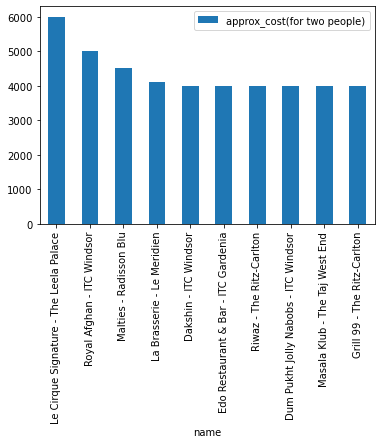

In [107]:
#Ploting on the bar plot

expencive_res.plot.bar()

In [108]:
#Alternate way - To make it Interactive, will make a use of "Plotly" Library over here.
len(expencive_res)

10

In [109]:
fig = px.bar(data_frame=expencive_res, x=expencive_res.index, y='approx_cost(for two people)', color=expencive_res.index,
            title='Most expensive retaurants in Banglore')
fig.update_layout(showlegend=False)

In [110]:
#Q3. Top 10 Cheapest Restaurants with Approx. Cost for 2 People.
df.groupby('name')['approx_cost(for two people)'].min().nsmallest(10)

name
Srinidhi Sagar               40
Srinidhi Sagar Deluxe        40
Srinidhi Sagar Food Line     40
Savera Cafe                  50
Namaste                      70
Nellore Dosa Camp            70
Bangarpet Chats              80
Dosa Cafe                    80
Dtink Lab                    80
50-50 EATING HOUSE          100
Name: approx_cost(for two people), dtype: int32

<AxesSubplot:xlabel='name'>

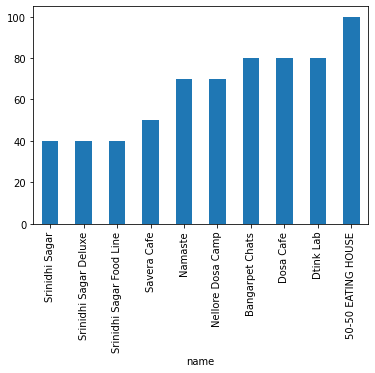

In [111]:
df.groupby('name')['approx_cost(for two people)'].min().nsmallest(10).plot.bar()

<AxesSubplot:xlabel='approx_cost(for two people)', ylabel='Density'>

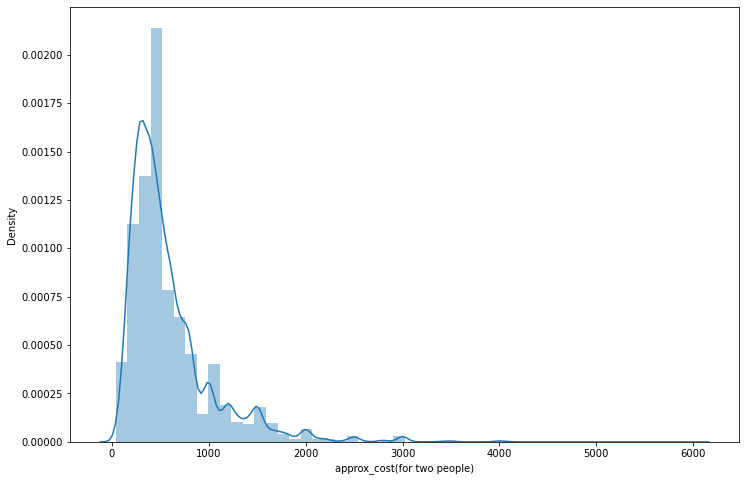

In [112]:
#Q4. What Pattern / Distribution 'Approx. Cost for 2 People' follows.
plt.figure(figsize=(12,8))
sns.distplot(df['approx_cost(for two people)'])

### Conclusion -

* So from this, you will see it Somehow follows some Skewness in our Data. Look at this right Skewness.
* It means Most of the Data, follows the Range between Zero to Thousand means about 50% of **Restaurants having approximate cost for 2 people is less than "1000 Rs." and they are Affordable too in Bangalore.**

In [113]:
#Q5. Find All the Restaurants that are below 500 (Budget Hotels) as well as Affordable.
#So, Let's 1st apply the filter to the DataFrame.
budget_res = df[df['approx_cost(for two people)'] <= 500]

In [114]:
#So, this exactly is that DataFrame of entire Restaurant that are under Budget or that are Budgeted Restaurants which are
#somewhere around '26K' Entries.

In [115]:
#Now, Let's access the 'name' and 'approx_cost(for two people)' Columns from the filtered DataFrame - 
budget_res = df[df['approx_cost(for two people)'] <= 500].loc[:, ('name', 'approx_cost(for two people)')]
budget_res.head()

,name,approx_cost(for two people)
3,Addhuri Udupi Bhojana,300
10,CafÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ© Down The A...,500
12,The Coffee Shack,500
13,Caf-Eleven,450
18,T3H Cafe,300


In [116]:
#Now, Let's Reset the Index -
budget_res = budget_res.reset_index()
budget_res.drop(columns='index', axis=1, inplace=True)
budget_res.head()

,name,approx_cost(for two people)
0,Addhuri Udupi Bhojana,300
1,CafÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ© Down The A...,500
2,The Coffee Shack,500
3,Caf-Eleven,450
4,T3H Cafe,300


In [117]:
#Setting "name" Column as an "Index" -
budget_res.set_index('name', inplace=True)

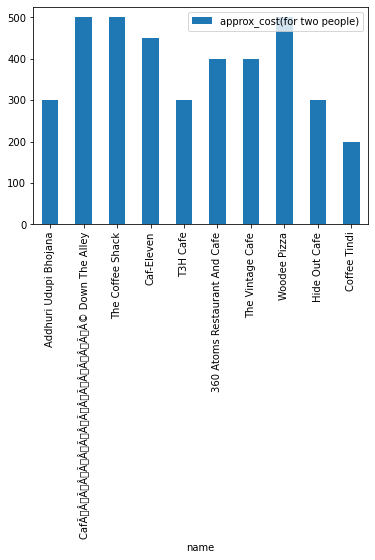

In [118]:
budget_res.head(10).plot.bar()

plt.xticks(rotation=90)

plt.show()

In [119]:
budget_res.index

Index(['Addhuri Udupi Bhojana',
       'CafÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ© Down The Alley',
       'The Coffee Shack', 'Caf-Eleven', 'T3H Cafe',
       '360 Atoms Restaurant And Cafe', 'The Vintage Cafe', 'Woodee Pizza',
       'Hide Out Cafe', 'Coffee Tindi',
       ...
       'Khane Ka Khazana', 'SLV Grand', 'Radha Rani', 'Just Parathas',
       'SeeYa Restaurant', 'Venice Kerala Restaurant',
       'Thai & Chinese Fast Food', 'The Crunch', 'Punjabi Charchay',
       'Raapchick'],
      dtype='object', name='name', length=26223)

In [120]:
#Converting into DataFrame using "reset_index()", So that our "name" Column will not be remains as "Index" anymore.
    #By doing that later we can Access the particular Element of the Column through "Indexing".
    
budget_res.reset_index(inplace=True)
budget_res

,name,approx_cost(for two people)
0,Addhuri Udupi Bhojana,300
1,CafÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ© Down The A...,500
2,The Coffee Shack,500
3,Caf-Eleven,450
4,T3H Cafe,300
...,...,...
26218,Venice Kerala Restaurant,200
26219,Thai & Chinese Fast Food,400
26220,The Crunch,300
26221,Punjabi Charchay,400


In [121]:
#Accesing that 2nd Name and trying to Change to an Appropriate One -
budget_res['name'][1] = "Cafe Down The Alley"

<AxesSubplot:xlabel='name'>

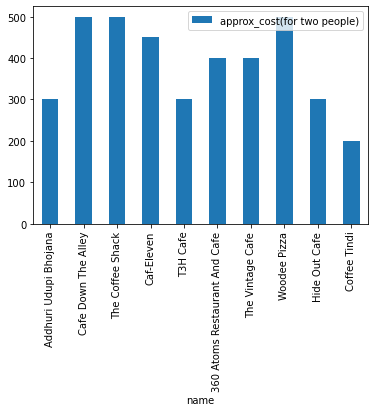

In [122]:
#Now, Again plot the Chart -
budget_res.set_index('name', inplace=True)
budget_res.head(10).plot.bar()

# Perform Spatial Analysis - 
## Use case 5 -

**1.Totoal restaurants that have good rating > 4 and that are under Budget too.**

**2. Total various affordable Hotels at all locations of Banglore.**

**3. Find the best Budget restaurants in any locations.**

**4. Which are the foodie Areas?**

In [123]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [124]:
#Q1. Total Restaurants that have good Rating > 4 and that are under Budget too.
good_rating_res = df[(df['rate'] > 4) & (df['approx_cost(for two people)'] <= 500)]

In [125]:
good_rating_res.shape
#So, It is saying I have somewhere around "2.4K" Total Entries in our Data that are somewhere 'Affordable' as well as having 
#good 'Rating'.

(2436, 17)

In [126]:
#Now, "Total Unique Number of Restaurants" -->
len(df[(df['rate'] > 4) & (df['approx_cost(for two people)'] <= 500)]['name'].unique())

372

### Conclusion -

* It is showing, that We have somewhere around **"372" Restaurants** that are **"Affordable"** as well as they have **good "Rating".**
* So, that s Final Conclusion of our Problem Statement.

In [127]:
#Let's see the DataFrame -
good_rating_res.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
10,https://www.zomato.com/bangalore/caf%C3%A9-dow...,"12,29 Near PES University Back Gate, D'Souza N...",CafÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ© Down The A...,Yes,No,4.1,402,080 26724489\r\n+91 7406048982,Banashankari,Cafe,"Waffles, Pasta, Crispy Chicken, Honey Chilli C...",Cafe,500,"[('Rated 4.0', 'RATED\n We ended up here on a...",[],Cafes,Banashankari
12,https://www.zomato.com/bangalore/the-coffee-sh...,"6th Block, 3rd Stage, Banashankari, Bangalore",The Coffee Shack,Yes,Yes,4.2,164,+91 9731644212,Banashankari,Cafe,"Coffee, Spaghetti, Pancakes, Nachos, Pasta, Sa...","Cafe, Chinese, Continental, Italian",500,"[('Rated 4.0', ""RATED\n Food - 4/5\nAmbience ...",[],Cafes,Banashankari
34,https://www.zomato.com/bangalore/faasos-banash...,"80, BDA Complex, 2nd Stage, Banashankari, Bang...",Faasos,Yes,No,4.2,415,+91 7700020020,Banashankari,Quick Bites,"Rolls, Veggie Wrap, Chocolate Fantasy, Rice Bo...","North Indian, Biryani, Fast Food",500,"[('Rated 3.0', 'RATED\n Not worth for the mon...","['Chole Kulcha Meal', 'Upvas Aloo Paratha With...",Delivery,Banashankari
51,https://www.zomato.com/bangalore/shree-cool-po...,"1514, 4th Cross, 7th Main, RPC layout, 2nd Sta...",Shree Cool Point,Yes,No,4.1,28,+91 9900617124,Vijay Nagar,Quick Bites,NaN,"Fast Food, Street Food, Beverages",150,"[('Rated 5.0', 'RATED\n Who would say no to s...","['Vegetable Sandwich', 'Vegetable Sandwich wit...",Delivery,Banashankari
52,https://www.zomato.com/bangalore/corner-house-...,"808/6-1, 24th A Cross, K.R Road, 2nd Stage, Ba...",Corner House Ice Cream,No,No,4.3,345,080 26713965\r\n+91 9845444155,Banashankari,Dessert Parlor,"Hot Chocolate Fudge, Vanilla Ice Cream, Fudge ...","Ice Cream, Desserts",400,"[('Rated 3.0', ""RATED\n Always a fan of corne...",[],Delivery,Banashankari


In [128]:
#Q2. Total various affordable Hotels at All Locations of Bangalore.

location = []
total = []

for loc, location_df in good_rating_res.groupby('location'):
    
    location.append(loc)
    total.append(len(location_df['name'].unique()))

In [129]:
#Now, if you want to Create a DataFrame of it.
location_df = pd.DataFrame(zip(location, total))
location_df.head()

,0,1
0,BTM,28
1,Banashankari,16
2,Banaswadi,1
3,Bannerghatta Road,9
4,Basavanagudi,24


In [130]:
#Assigining name to columns
location_df.columns = ['Location', 'Total_restaurants']
location_df.head()

,Location,Total_restaurants
0,BTM,28
1,Banashankari,16
2,Banaswadi,1
3,Bannerghatta Road,9
4,Basavanagudi,24


In [131]:
#So, this exactly is my entire DataFrame.
#This exactly is a Solution of our Problem Statement.

In [135]:
#Q3. Finding Best Budget Restaurants in any Location.

def return_budget(location, restaurant):
    df[(df['approx_cost(for two people)']<=400)&(df['location']==location)&(df['rate']>4)&
    (df['rest_type']==restaurant)]

    return df['name'].unique()

In [136]:
#Now, Let's see the Result -
#Suppose our 'location' is "BTM" and Suppose, our 'restaurant type' is "Quick Bites".
return_budget('BTM', 'Quick Bites')

array(['Jalsa', 'Spice Elephant', 'San Churro Cafe', ...,
       'The Nest - The Den Bengaluru', 'Nawabs Empire',
       'SeeYa Restaurant'], dtype=object)

### Conclusion -

* These are our basically **'Best Budget Restaurants'** in terms of **"BTM" and for "Quick Bites"** Restaurants Type.

In [137]:
#Q4. Which are the (most) Foodie Areas?    

#Suppose, we want 'Top 20 Places'.

# zomato_df['location'].value_counts().nlargest(20)      #OR
restaurant_location = df['location'].value_counts()[0:20]
restaurant_location

BTM                      4210
Koramangala 5th Block    2358
HSR                      2102
Indiranagar              1889
JP Nagar                 1842
Jayanagar                1709
Whitefield               1683
Marathahalli             1470
Bannerghatta Road        1314
Koramangala 6th Block    1088
Brigade Road             1084
Koramangala 7th Block    1084
Bellandur                1063
Koramangala 1st Block     964
Electronic City           955
Sarjapur Road             907
Ulsoor                    901
Koramangala 4th Block     864
MG Road                   818
Banashankari              805
Name: location, dtype: int64

Text(0.5, 1.0, 'Most Foodie Areas of Banglore')

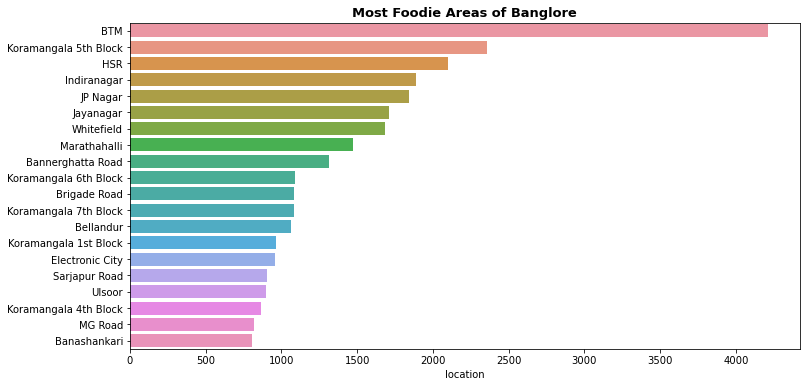

In [138]:
#Now, Let's Visualize this Data -
plt.figure(figsize=(12,6))

sns.barplot(x=restaurant_location, y=restaurant_location.index)
plt.title("Most Foodie Areas of Banglore", fontsize=13, fontweight='bold')

### Conclusion -

* From this Visualization, we can say that **"BTM", "5th Block", and "HSR"** has the Most Number of Restaurants.
* So, it means **"BTM" dominates the section by having around "5K" Restaurants.**

## Perform Spatial Analysis Part 2

**1. Find lat and log for each of the locations of Banglore.**

**2. Generate BaseMap of Banglore**

**3. HeatMap of Restaurants**

**4. HeatMap of North Indian Restaurants**

In [139]:
#Now, Let's check "unique" Locations -
df['location'].unique()

array(['Banashankari', 'Basavanagudi', 'Mysore Road', 'Jayanagar',
       'Kumaraswamy Layout', 'Rajarajeshwari Nagar', 'Vijay Nagar',
       'Uttarahalli', 'JP Nagar', 'South Bangalore', 'City Market',
       'Bannerghatta Road', 'BTM', 'Kanakapura Road', 'Bommanahalli',
       'CV Raman Nagar', 'Electronic City', 'Wilson Garden',
       'Shanti Nagar', 'Koramangala 5th Block', 'Richmond Road', 'HSR',
       'Marathahalli', 'Koramangala 7th Block', 'Bellandur',
       'Sarjapur Road', 'Whitefield', 'East Bangalore',
       'Old Airport Road', 'Indiranagar', 'Koramangala 1st Block',
       'Frazer Town', 'MG Road', 'Brigade Road', 'Lavelle Road',
       'Church Street', 'Ulsoor', 'Residency Road', 'Shivajinagar',
       'Infantry Road', 'St. Marks Road', 'Cunningham Road',
       'Race Course Road', 'Commercial Street', 'Vasanth Nagar', 'Domlur',
       'Koramangala 8th Block', 'Ejipura', 'Jeevan Bhima Nagar',
       'Old Madras Road', 'Seshadripuram', 'Kammanahalli',
       'Koramanga

In [140]:
#Checking the Length of our Unique Locations -
len(df['location'].unique())

92

In [141]:
#Let's identify the Data which having/contains "Bangalore" in the given data -
location_with_Bangalore = df.loc[df['location'].str.contains("Bangalore")]['location']

In [142]:
location_with_Bangalore

355      South Bangalore
629      South Bangalore
830      South Bangalore
1359     South Bangalore
1408     South Bangalore
              ...       
49498    South Bangalore
50255     East Bangalore
50613     East Bangalore
50818     East Bangalore
51213     East Bangalore
Name: location, Length: 148, dtype: object

In [143]:
#Now, Let's process this data -
def data_processing(data):
    data = data.replace('Bangalore', '').strip()
    return data

In [144]:
#Now, Let's apply this Function to this particular Data -
location_with_Bangalore.apply(data_processing)

355      South
629      South
830      South
1359     South
1408     South
         ...  
49498    South
50255     East
50613     East
50818     East
51213     East
Name: location, Length: 148, dtype: object

In [145]:
#Now, Let's apply this Function to our whole/entire Data -
df['location (Processed)'] = df['location'].apply(data_processing)

In [146]:
df['location (Processed)']

0                      Banashankari
1                      Banashankari
2                      Banashankari
3                      Banashankari
4                      Basavanagudi
                    ...            
51709                    Whitefield
51711                    Whitefield
51712                    Whitefield
51715    ITPL Main Road, Whitefield
51716    ITPL Main Road, Whitefield
Name: location (Processed), Length: 43541, dtype: object

In [149]:
#Now, Let's move-on to do further pre-processing -
mylist = []
for i in df['location (Processed)']:
    i = i+' Bangalore'
    mylist.append(i)

In [150]:
mylist

['Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Basavanagudi Bangalore',
 'Basavanagudi Bangalore',
 'Mysore Road Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Basavanagudi Bangalore',
 'Basavanagudi Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 'Banashankari Bangalore',
 '

In [151]:
#Now, Let's pass this List to our DataFrame feature -

df['location (Processed)'] = mylist

In [152]:
df['location (Processed)']

0                      Banashankari Bangalore
1                      Banashankari Bangalore
2                      Banashankari Bangalore
3                      Banashankari Bangalore
4                      Basavanagudi Bangalore
                         ...                 
51709                    Whitefield Bangalore
51711                    Whitefield Bangalore
51712                    Whitefield Bangalore
51715    ITPL Main Road, Whitefield Bangalore
51716    ITPL Main Road, Whitefield Bangalore
Name: location (Processed), Length: 43541, dtype: object

In [153]:
#Now, Let's check the "unique" Locations in this "location" Column.

df['location (Processed)'].unique()

array(['Banashankari Bangalore', 'Basavanagudi Bangalore',
       'Mysore Road Bangalore', 'Jayanagar Bangalore',
       'Kumaraswamy Layout Bangalore', 'Rajarajeshwari Nagar Bangalore',
       'Vijay Nagar Bangalore', 'Uttarahalli Bangalore',
       'JP Nagar Bangalore', 'South Bangalore', 'City Market Bangalore',
       'Bannerghatta Road Bangalore', 'BTM Bangalore',
       'Kanakapura Road Bangalore', 'Bommanahalli Bangalore',
       'CV Raman Nagar Bangalore', 'Electronic City Bangalore',
       'Wilson Garden Bangalore', 'Shanti Nagar Bangalore',
       'Koramangala 5th Block Bangalore', 'Richmond Road Bangalore',
       'HSR Bangalore', 'Marathahalli Bangalore',
       'Koramangala 7th Block Bangalore', 'Bellandur Bangalore',
       'Sarjapur Road Bangalore', 'Whitefield Bangalore',
       'East Bangalore', 'Old Airport Road Bangalore',
       'Indiranagar Bangalore', 'Koramangala 1st Block Bangalore',
       'Frazer Town Bangalore', 'MG Road Bangalore',
       'Brigade Road Bang

In [154]:
#Checking the Length of our Unique Locations -
len(df['location (Processed)'].unique())

92

In [155]:
#Now, Let's deep dive into "Geo-graphical" Analysis -

locations = pd.DataFrame({"Name": df['location (Processed)'].unique()})
locations.head()

,Name
0,Banashankari Bangalore
1,Basavanagudi Bangalore
2,Mysore Road Bangalore
3,Jayanagar Bangalore
4,Kumaraswamy Layout Bangalore


In [156]:
#importing Geopy library
#Each and Every 'geolocation' Service has its own Class in 'geographical Python', which is my 'geopy'.
#So, Very First, Let's import them and Set Connection to this "Open Street Map".

In [157]:
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent='app')

In [158]:
#Q1. Find Latitudes and Logitudes for each of the Locations of Bangalore.

latitude = []
longitude = []

for location in locations['Name']:
    location = geolocator.geocode(location)
    
    if location is None:
        latitude.append(np.nan)
        longitude.append(np.nan)
        
    else:
        latitude.append(location.latitude)
        longitude.append(location.longitude)

In [160]:
# Now, Add these ('Latitude' & 'Longitude') Columns to DataFrame -
locations['Latitude'] = latitude
locations['Longitude'] = longitude

In [161]:
#Now, Let's Check What we've got in our DataFrame -
locations.head()

,Name,Latitude,Longitude
0,Banashankari Bangalore,12.965283,77.594452
1,Basavanagudi Bangalore,12.941726,77.575502
2,Mysore Road Bangalore,12.946662,77.530090
3,Jayanagar Bangalore,12.929273,77.582423
4,Kumaraswamy Layout Bangalore,12.908149,77.555318


In [162]:
locations.shape

(92, 3)

In [163]:
#Now, Let's get the Top Locations -
rest_location = pd.DataFrame(df['location (Processed)'].value_counts().reset_index())

In [165]:
rest_location.head()

,index,location (Processed)
0,BTM Bangalore,4210
1,Koramangala 5th Block Bangalore,2358
2,HSR Bangalore,2102
3,Indiranagar Bangalore,1889
4,JP Nagar Bangalore,1842


In [166]:
#Now, Let's pre-process this DataFrame -
rest_location.columns = ['Name', 'Count']

In [167]:
rest_location.head()

,Name,Count
0,BTM Bangalore,4210
1,Koramangala 5th Block Bangalore,2358
2,HSR Bangalore,2102
3,Indiranagar Bangalore,1889
4,JP Nagar Bangalore,1842


In [174]:
#Now, Let's 'Combine'/'Merge' both our DataFrame -
    #So, Very 1st one is my "rest_Locations" and the 2nd one is my "Locations".
    
Restaurant_Locations = rest_location.merge(locations, on='Name', how='left').dropna()
Restaurant_Locations.head()

,Name,Count,Latitude,Longitude
0,BTM Bangalore,4210,12.911276,77.604565
1,Koramangala 5th Block Bangalore,2358,12.934843,77.618977
2,HSR Bangalore,2102,12.909234,77.639867
3,Indiranagar Bangalore,1889,12.973291,77.640467
4,JP Nagar Bangalore,1842,12.907251,77.578271


In [175]:
#Q2. Generate BaseMap of Bangalore. -->
#To Create "Map" or To Create "Interactive Maps", we need "folium" Library.
#Then, we have to Import our 'folium' Library with HeatMap -

In [176]:
import folium
from folium.plugins import HeatMap

In [177]:
#Now, Let's Create a 'BaseMap' -

def generateBaseMap(default_location=[12.97, 77.59], default_zoom_start=12):
    baseMap = folium.Map(location=default_location, zoom_start=default_zoom_start)
    
    return baseMap

In [178]:
#Now, Call our 'Function' with "default_location" and "default_zoom_start" will be my Parameters.

baseMap = generateBaseMap()

In [179]:
#Then, Call the 'baseMap' -
baseMap

In [180]:
#Q3. Create a HeatMap of Restaurants in Bangalore.

HeatMap(Restaurant_Locations[['Latitude','Longitude','Count']], zoom=20).add_to(baseMap)

In [181]:
#Then, Call our 'baseMap' 
baseMap

In [182]:
#So, from this Visualization, we can see All the Restaurants are Located over here.

### Conclusion -

* So, To make an inferences from this HeatMap, it is damn clear that We have **very High Clutter/Density of Restaurants** in **"South-East" Bangalore Area.** It means **very High Number of Restaurants** are there.
* On the other hand, As we move away from "Central" Bangalore region, will figure-out, We have **Less Number of Restaurants.**
* In short, From this HeatMap, We can see that **Most of the Restaurants** are situated in the **"South-East Bangalore Area".**

# Analyzing Most Popular Cuisines:
## Usecase - 7

1. HeatMap of North Indian Restaurants.

In [183]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city),location (Processed)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari,Banashankari Bangalore
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari,Banashankari Bangalore
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari,Banashankari Bangalore
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari,Banashankari Bangalore
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari,Basavanagudi Bangalore


In [184]:
#Q1. HeatMap of North Indian Restaurants

cuisines_df = df[df['cuisines'] =='North Indian']
cuisines_df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city),location (Processed)
5,https://www.zomato.com/bangalore/timepass-dinn...,"37, 5-1, 4th Floor, Bosco Court, Gandhi Bazaar...",Timepass Dinner,Yes,No,3.8,286,+91 9980040002\r\n+91 9980063005,Basavanagudi,Casual Dining,"Onion Rings, Pasta, Kadhai Paneer, Salads, Sal...",North Indian,600,"[('Rated 3.0', 'RATED\n Food 3/5\nAmbience 3/...",[],Buffet,Banashankari,Basavanagudi Bangalore
50,https://www.zomato.com/bangalore/petoo-banasha...,"276, Ground Floor, 100 Feet Outer Ring Road, B...",Petoo,No,No,3.7,21,+91 8026893211,Banashankari,Quick Bites,NaN,North Indian,450,"[('Rated 2.0', 'RATED\n This is a neatly made...",[],Delivery,Banashankari,Banashankari Bangalore
72,https://www.zomato.com/bangalore/spicy-tandoor...,"Opposite ICICi Bank, Hanuman Nagar, Banashanka...",Spicy Tandoor,No,No,0.0,0,+91 8050884222,Banashankari,Quick Bites,NaN,North Indian,150,"[('Rated 4.0', 'RATED\n cost for chicken roll...",[],Delivery,Banashankari,Banashankari Bangalore
87,https://www.zomato.com/bangalore/krishna-sagar...,"38, 22nd Main, 22nd Cross, Opposite BDA, 2nd S...",Krishna Sagar,No,No,3.5,31,+91 8892752997\r\n+91 7204780429,Banashankari,Quick Bites,NaN,North Indian,200,"[('Rated 1.0', 'RATED\n Worst experience with...",[],Delivery,Banashankari,Banashankari Bangalore
94,https://www.zomato.com/bangalore/nandhini-delu...,"304, Opposite Apollo Public School, 100 Feet R...",Nandhini Deluxe,No,No,2.6,283,080 26890011\r\n080 26890033,Banashankari,Casual Dining,"Biryani, Chicken Guntur, Thali, Buttermilk, Ma...",North Indian,600,"[('Rated 3.0', 'RATED\n Ididnt like much.\n\n...",[],Delivery,Banashankari,Banashankari Bangalore


In [187]:
#Now, Let's group those 'Locations' with 'Total Numbers' -

north_indian = cuisines_df.groupby(['location (Processed)'], as_index=False)['url'].agg('count')
north_indian.head()

,location (Processed),url
0,BTM Bangalore,262
1,Banashankari Bangalore,35
2,Banaswadi Bangalore,5
3,Bannerghatta Road Bangalore,60
4,Basavanagudi Bangalore,17


In [188]:
#'Rename' the Columns -
north_indian.columns = ['Name', 'Count']
north_indian.head()

,Name,Count
0,BTM Bangalore,262
1,Banashankari Bangalore,35
2,Banaswadi Bangalore,5
3,Bannerghatta Road Bangalore,60
4,Basavanagudi Bangalore,17


In [189]:
#Now, Let's "Merge" this 'north_Indian' DataFrame to our 'locations' DataFrame.
north_indian = north_indian.merge(locations, on='Name', how='left').dropna()
north_indian.head()

,Name,Count,Latitude,Longitude
0,BTM Bangalore,262,12.911276,77.604565
1,Banashankari Bangalore,35,12.965283,77.594452
2,Banaswadi Bangalore,5,13.014162,77.651854
3,Bannerghatta Road Bangalore,60,12.888586,77.597307
4,Basavanagudi Bangalore,17,12.941726,77.575502


In [190]:
#Now, Let's Plot the "HeatMap" -

baseMap = generateBaseMap()

HeatMap(north_indian[['Latitude','Longitude','Count']], zoom=20).add_to(baseMap)

baseMap

## Conclusion -

* From this HeatMap, we can come to a Conclusion that, In "South-East" Bangalore Region, We have **"Maximum Number of North Indian Restaurants".**
* So, you can Conclude that, again in this Zone, We have a **"Maximum Number of North Indian People".**